<a href="https://colab.research.google.com/github/jefftavlin/Dragon-Ball-Z-Classifier/blob/main/Z_fighter_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os

import numpy as np
import pandas as pd
pd.set_option('display.max_colwidth', None)

import seaborn as sns
import random
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from skimage import io
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

import cv2
import PIL
import zipfile
import shutil
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dropout, SpatialDropout2D, BatchNormalization, Input, Activation, Dense, Flatten
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

from google.colab import drive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [2]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Peek:

In [3]:
os.getcwd()

'/content'

In [4]:
root = '/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier'

In [5]:
os.listdir(root)

['Goku',
 'Piccolo',
 'Vegeta',
 'resnet50_zfighter.h5',
 'goku_test.PNG',
 'piccolo_test.jpg',
 'vegeta_test.png',
 'vegeta_test2.png',
 'piccolo_test2.jpg',
 'Z_fighter_classifier.ipynb']

In [6]:
goku_path = root + '/Goku'
vegeta_path = root + '/Vegeta'
piccolo_path = root + '/Piccolo'

In [7]:
def file_corrupt_checker(path):
  bad_files = []
  for filename in os.listdir(path):
    try:
      img = Image.open(path + '/' +filename) # open the image file
      img.verify() # verify that it is, in fact an image
    except (IOError, SyntaxError) as e:
      print('Bad file:', filename) # print out the names of corrupt files
      bad_files.append(filename)
  return bad_files

In [8]:
bad_goku_files = file_corrupt_checker(goku_path)
bad_vegeta_files = file_corrupt_checker(vegeta_path)
bad_piccolo_files = file_corrupt_checker(piccolo_path)

Bad file: Vegeta_1271.jpg
Bad file: Vegeta_1640.jpg
Bad file: Vegeta_236.jpg
Bad file: Piccolo_851.jpg


In [9]:
bad_files = bad_goku_files + bad_vegeta_files + bad_piccolo_files
for item in bad_files:
  print(item)

Vegeta_1271.jpg
Vegeta_1640.jpg
Vegeta_236.jpg
Piccolo_851.jpg


In [10]:
print(f'The number of Goku images are {len(os.listdir(goku_path))}')
print(f'The number of Vegeta images are {len(os.listdir(vegeta_path))}')
print(f'The number of Piccolo images are {len(os.listdir(piccolo_path))}')

The number of Goku images are 1517
The number of Vegeta images are 1813
The number of Piccolo images are 1387


In [11]:
total_images = os.listdir(goku_path)+ os.listdir(vegeta_path) + os.listdir(piccolo_path)
total_images = [img for img in total_images if img not in bad_files]
print(len(total_images))

4713


In [12]:
total_image_paths = []

for img in total_images:
    if 'Goku' in img:
        total_image_paths.append(goku_path + '/' + img)
    elif 'Piccolo' in img:
        total_image_paths.append(piccolo_path + '/' + img)
    else:
        total_image_paths.append(vegeta_path + '/' + img)

In [13]:
print(len(total_image_paths))

4713


In [14]:
df = pd.DataFrame({'file_name':total_images, 'file_path':total_image_paths})
display(df.sample(5))

,file_name,file_path
2408,Vegeta_1708.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Vegeta/Vegeta_1708.jpg
681,Goku_1188.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Goku/Goku_1188.jpg
3598,Piccolo_661.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Piccolo/Piccolo_661.jpg
928,Goku_1438.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Goku/Goku_1438.jpg
695,Goku_1206.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Goku/Goku_1206.jpg


In [15]:
df['label'] = df['file_name'].apply(lambda x: x.split('_')[0])
df.sample(5)

,file_name,file_path,label
1621,Vegeta_912.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Vegeta/Vegeta_912.jpg,Vegeta
2903,Vegeta_390.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Vegeta/Vegeta_390.jpg,Vegeta
3389,Piccolo_449.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Piccolo/Piccolo_449.jpg,Piccolo
3727,Piccolo_788.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Piccolo/Piccolo_788.jpg,Piccolo
4470,Piccolo_144.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Piccolo/Piccolo_144.jpg,Piccolo


In [16]:
df['label'].value_counts()

Vegeta     1810
Goku       1517
Piccolo    1386
Name: label, dtype: int64

In [17]:
def clean():
  plt.tight_layout()
  plt.show()

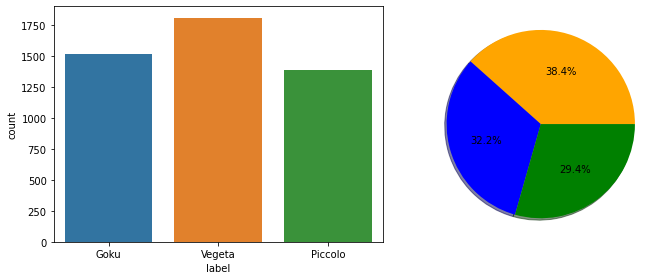

In [18]:
fig, (ax1,ax2) = plt.subplots(ncols = 2, nrows = 1 ,figsize = (10,4))

sns.countplot(x = df['label'], ax = ax1)
ax2.pie(df['label'].value_counts(), autopct='%1.1f%%', shadow = True, colors = ['Orange','Blue','Green'])

clean()

In [19]:
def plot_random_batch(n, df, feature, path):
    sample_df = df[[path,feature]].copy()
    sample_df = sample_df.sample(n)
    
    for num, x in enumerate(sample_df.values):
        img = load_img(sample_df.iloc[num][0], target_size = (224,224))
        plt.subplot(6,6,num+1)
        plt.xlabel(sample_df.iloc[num][1])
        plt.imshow(img)
    
    plt.gcf().set_size_inches(15, 15)
    plt.tight_layout()
    plt.show()

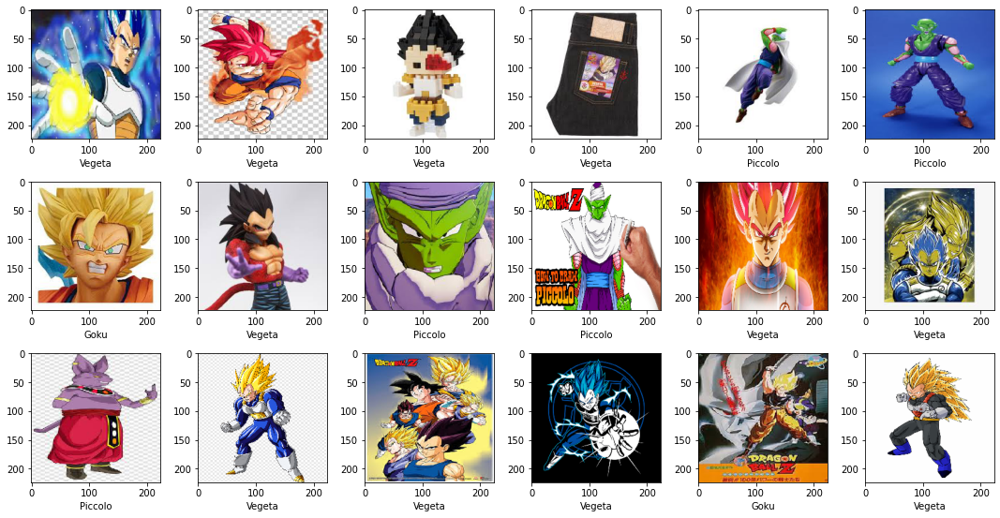

In [20]:
plot_random_batch(18,df, 'label','file_path')

# Splitting the Data:

In [21]:
train_df, test_df = train_test_split(df, test_size=0.2,shuffle = True)

In [22]:
train_df, valid_df = train_test_split(train_df, test_size=0.2,shuffle = True)

In [23]:
print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)

(3016, 3)
(754, 3)
(943, 3)


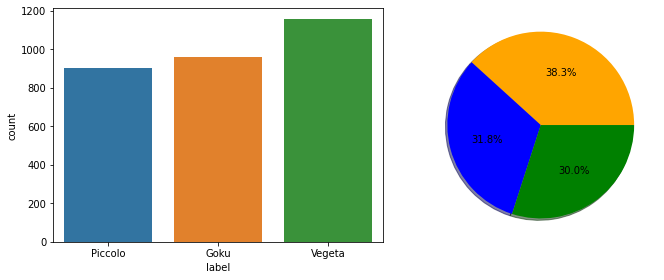

In [24]:
fig, (ax1,ax2) = plt.subplots(ncols = 2, nrows = 1 ,figsize = (10,4))

sns.countplot(x = train_df['label'], ax = ax1)
ax2.pie(train_df['label'].value_counts(), autopct='%1.1f%%', shadow = True, colors = ['Orange','Blue','Green'])

clean()

# ResNet 50

### ResNet50 Generators

In [25]:
batch_size = 32
size = 224

In [26]:
def batch_shape(generator):
  for data_batch, labels_batch in generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

In [27]:
res_train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

res_train_generator = res_train_datagen.flow_from_dataframe(
    train_df, 
    x_col='file_path',
    y_col='label',
    target_size=(size,size),
    class_mode='categorical',
    batch_size=batch_size)

Found 3016 validated image filenames belonging to 3 classes.


In [28]:
res_validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.resnet50.preprocess_input)

res_validation_generator = res_validation_datagen.flow_from_dataframe(
    valid_df, 
    x_col='file_path',
    y_col='label',
    target_size=(size,size),
    class_mode='categorical',
    batch_size=batch_size)

Found 754 validated image filenames belonging to 3 classes.


In [29]:
batch_shape(res_train_generator)

data batch shape: (32, 224, 224, 3)
labels batch shape: (32, 3)


In [30]:
first_batch = next(iter(res_train_generator))

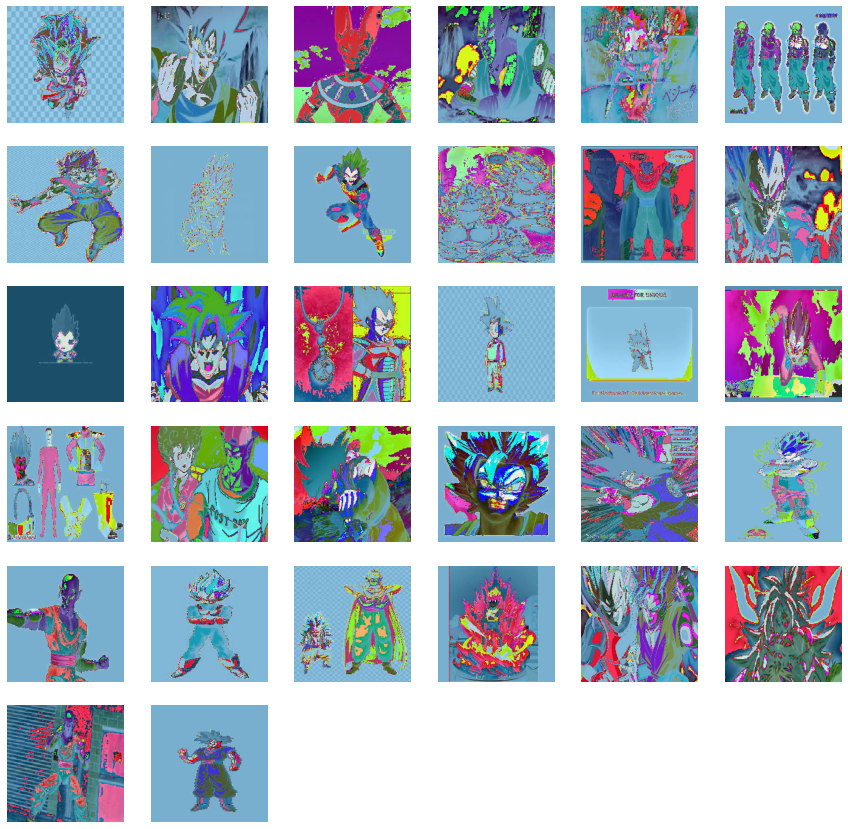

In [31]:
for num, x in enumerate(first_batch[0]):
    img = x
    plt.subplot(6,6,num+1)
    plt.axis('off')
    #plt.imshow(img)
    plt.imshow((img * 255).astype(np.uint8))

plt.gcf().set_size_inches(15, 15)

### ResNet 50 Model

In [32]:
res_base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top = False)

94773248/94765736 [==============================] - 0s 0us/step


In [33]:
print(f"The number of layers in the network are: {len(res_base_model.layers)}")

The number of layers in the network are: 175


In [34]:
res_base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [35]:
x = res_base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
preds = tf.keras.layers.Dense(3, activation ='softmax')(x)

In [36]:
res_model = tf.keras.models.Model(inputs=res_base_model.input, outputs=preds)
print(res_model.summary())

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

In [37]:
for layer in res_model.layers[:177]:
  layer.trainable = False

In [38]:
for layer in res_model.layers[177:]:
  layer.trainable = True

In [39]:
res_model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [40]:
res_history = res_model.fit(res_train_generator, steps_per_epoch=res_train_generator.n//res_train_generator.batch_size, 
                              epochs = 3, validation_data = res_validation_generator)

Epoch 1/3
48/94 [==============>...............] - ETA: 10s - loss: 0.8786 - accuracy: 0.5990

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


94/94 [==============================] - 30s 315ms/step - loss: 0.7374 - accuracy: 0.6702 - val_loss: 0.5755 - val_accuracy: 0.7401
Epoch 2/3
94/94 [==============================] - 23s 242ms/step - loss: 0.4087 - accuracy: 0.8314 - val_loss: 0.3798 - val_accuracy: 0.8634
Epoch 3/3
94/94 [==============================] - 23s 243ms/step - loss: 0.2690 - accuracy: 0.8948 - val_loss: 0.2917 - val_accuracy: 0.8952


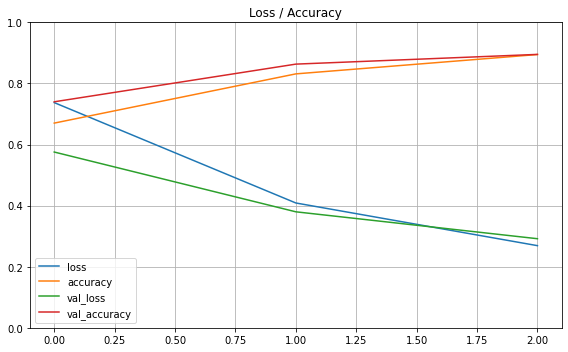

In [41]:
pd.DataFrame(res_history.history).plot(figsize=(8, 5))
plt.title('Loss / Accuracy')

plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]

plt.tight_layout()
plt.show()

### Test ResNet50

In [42]:
label_map = dict((v,k) for k,v in res_train_generator.class_indices.items())
label_map

{0: 'Goku', 1: 'Piccolo', 2: 'Vegeta'}

In [43]:
res_test_generator = res_validation_datagen.flow_from_dataframe(
    test_df,
    x_col='file_path',
    y_col=None,
    class_mode=None,
    target_size=(size,size),
    batch_size=batch_size,
    shuffle=False)

Found 943 validated image filenames.


In [44]:
res_predictions = res_model.predict(res_test_generator)

In [45]:
test_df = test_df.copy()
test_df['res_label'] = np.argmax(res_predictions, axis =-1)
test_df['res_label'] = test_df['res_label'].replace(label_map)

In [46]:
test_df['res_correct'] = test_df.apply(lambda x: x['label'] == x['res_label'], axis =1)

In [47]:
test_df.head()

,file_name,file_path,label,res_label,res_correct
1324,Goku_321.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Goku/Goku_321.jpg,Goku,Goku,True
3633,Piccolo_692.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Piccolo/Piccolo_692.jpg,Piccolo,Piccolo,True
2616,Vegeta_99.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Vegeta/Vegeta_99.jpg,Vegeta,Vegeta,True
1841,Vegeta_1139.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Vegeta/Vegeta_1139.jpg,Vegeta,Goku,False
1211,Goku_209.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Goku/Goku_209.jpg,Goku,Goku,True


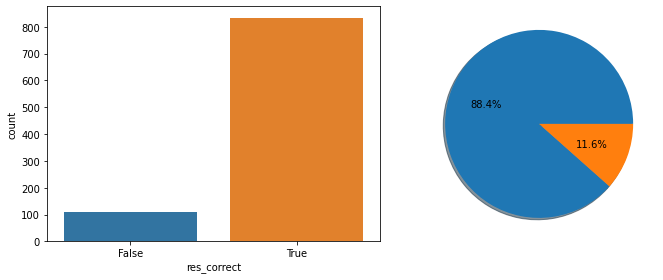

In [48]:
fig, (ax1,ax2) = plt.subplots(ncols = 2, nrows =1, figsize = (10,4))

sns.countplot(x = test_df['res_correct'],ax =ax1)
ax2.pie(test_df['res_correct'].value_counts(), autopct='%1.1f%%', shadow = True)

clean()

In [49]:
sample_df = test_df.sample(18)

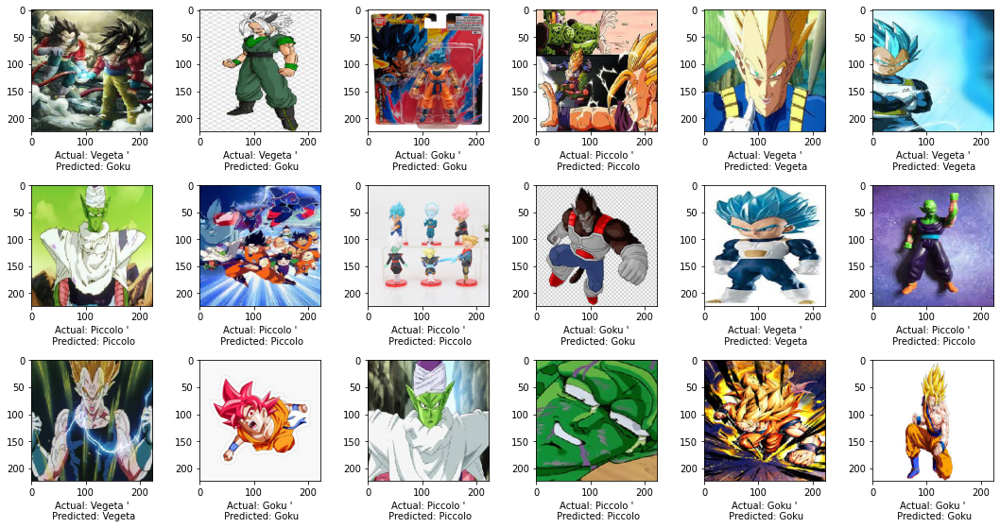

In [50]:
for num, x in enumerate(sample_df.values):
    img = load_img(sample_df.iloc[num][1], target_size = (224,224))
    plt.subplot(6,6,num+1)
    plt.xlabel(f"Actual: {sample_df.iloc[num][2]} '\n Predicted: {sample_df.iloc[num][3]}")
    plt.imshow(img)

plt.gcf().set_size_inches(15, 15)
clean()

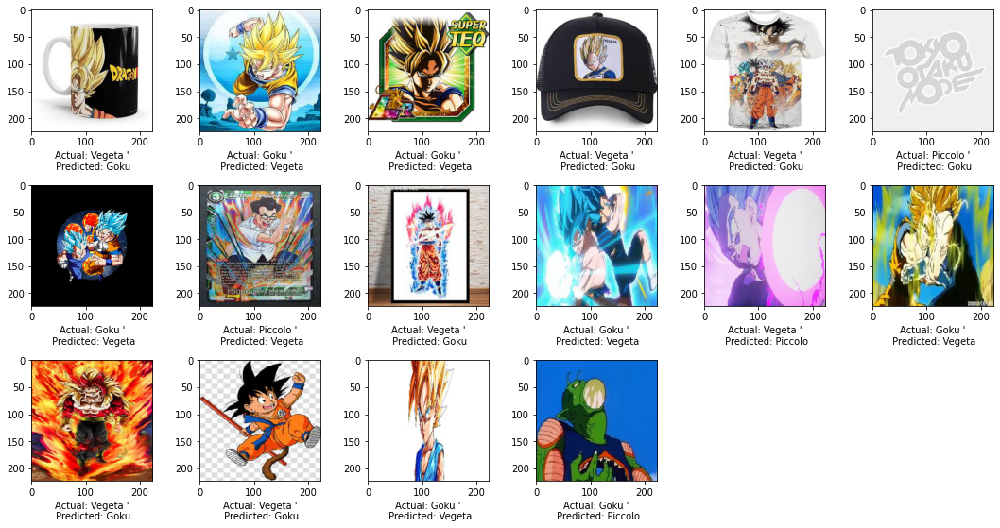

In [51]:
# Plot some of my errors

errors = test_df[test_df['res_correct'] == False]
errors_sample = errors.sample(16)

for num, x in enumerate(errors_sample.values):
    img = load_img(errors_sample.iloc[num][1], target_size = (224,224))
    plt.subplot(6,6,num+1)
    plt.xlabel(f"Actual: {errors_sample.iloc[num][2]} '\n Predicted: {errors_sample.iloc[num][3]}")
    plt.imshow(img)

plt.gcf().set_size_inches(15, 15)
clean()

In [52]:
resnet50_zfighter = res_model.save(root + '/' + 'resnet50_zfighter.h5')

In [53]:
os.listdir(root)

['Goku',
 'Piccolo',
 'Vegeta',
 'resnet50_zfighter.h5',
 'goku_test.PNG',
 'piccolo_test.jpg',
 'vegeta_test.png',
 'vegeta_test2.png',
 'piccolo_test2.jpg',
 'Z_fighter_classifier.ipynb']

### Test ResNet50 Random Images

In [54]:
os.listdir(root)

['Goku',
 'Piccolo',
 'Vegeta',
 'resnet50_zfighter.h5',
 'goku_test.PNG',
 'piccolo_test.jpg',
 'vegeta_test.png',
 'vegeta_test2.png',
 'piccolo_test2.jpg',
 'Z_fighter_classifier.ipynb']

In [55]:
img_goku_test = root + '/goku_test.PNG'
img_vegeta_test = root + '/vegeta_test.png'
img_piccolo_test = root + '/piccolo_test.jpg'

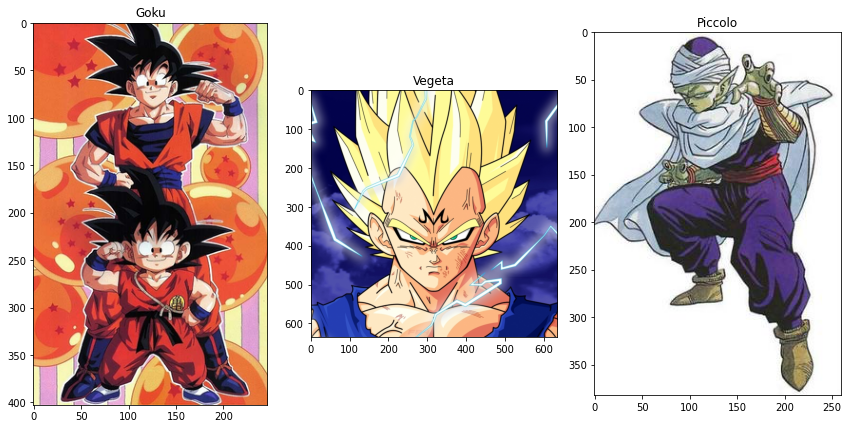

In [56]:
fig, (ax1,ax2, ax3) = plt.subplots(ncols=3, nrows =1,figsize = (12,6))

img1 = mpimg.imread(img_goku_test)
ax1.set_title('Goku')
ax1.imshow(img1)

img2 = mpimg.imread(img_vegeta_test)
ax2.set_title('Vegeta')
ax2.imshow(img2)

img3 = mpimg.imread(img_piccolo_test)
ax3.set_title('Piccolo')
ax3.imshow(img3)

clean()

In [57]:
def predict_resnet_img(img,model):
  img  = load_img(img)
  img = img_to_array(img)
  img = np.expand_dims(img, axis=0)
  img = tf.keras.applications.resnet50.preprocess_input(img)
  prediction = model.predict(img)
  return prediction

In [58]:
label_map

{0: 'Goku', 1: 'Piccolo', 2: 'Vegeta'}

In [59]:
print(predict_resnet_img(img_goku_test,res_model))
print(predict_resnet_img(img_vegeta_test,res_model))
print(predict_resnet_img(img_piccolo_test,res_model))

[[0.95463175 0.0078761  0.03749221]]
[[0.7571143  0.00896261 0.23392312]]
[[0.2957846  0.38767734 0.31653807]]


### Check ResNet50

In [60]:
img_vegeta_test2 = root + '/vegeta_test2.png'

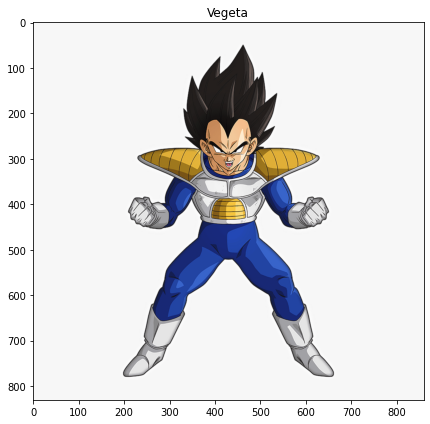

In [61]:
fig, ax1 = plt.subplots(figsize = (12,6))

img1 = mpimg.imread(img_vegeta_test2)
ax1.set_title('Vegeta')
ax1.imshow(img1)

clean()

In [62]:
img_piccolo_test2 = root + '/piccolo_test2.jpg'

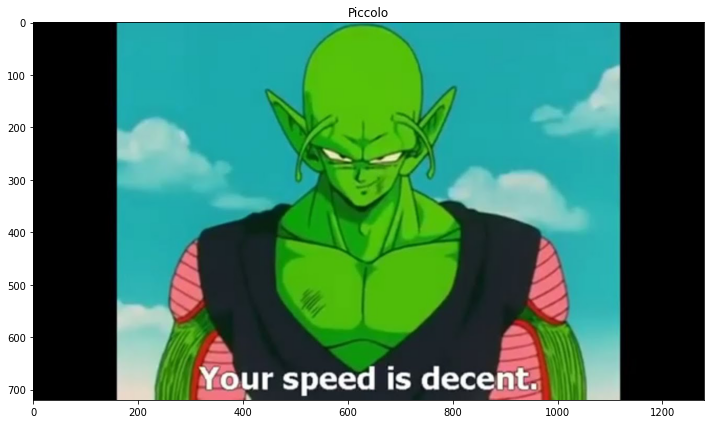

In [63]:
fig, ax1 = plt.subplots(figsize = (12,6))

img1 = mpimg.imread(img_piccolo_test2)
ax1.set_title('Piccolo')
ax1.imshow(img1)

clean()

In [64]:
print(predict_resnet_img(img_piccolo_test2,res_model))

[[0.09324402 0.3332226  0.5735334 ]]


In [65]:
def plot_batch(df):
  sample_df = df.sample(18)
  for num, x in enumerate(sample_df.values):
    img = load_img(sample_df.iloc[num][1], target_size = (224,224))
    plt.subplot(6,6,num+1)
    plt.xlabel(f"Actual: {sample_df.iloc[num][2]} '\n Predicted: {sample_df.iloc[num][3]}")
    plt.imshow(img)
  plt.gcf().set_size_inches(15, 15)

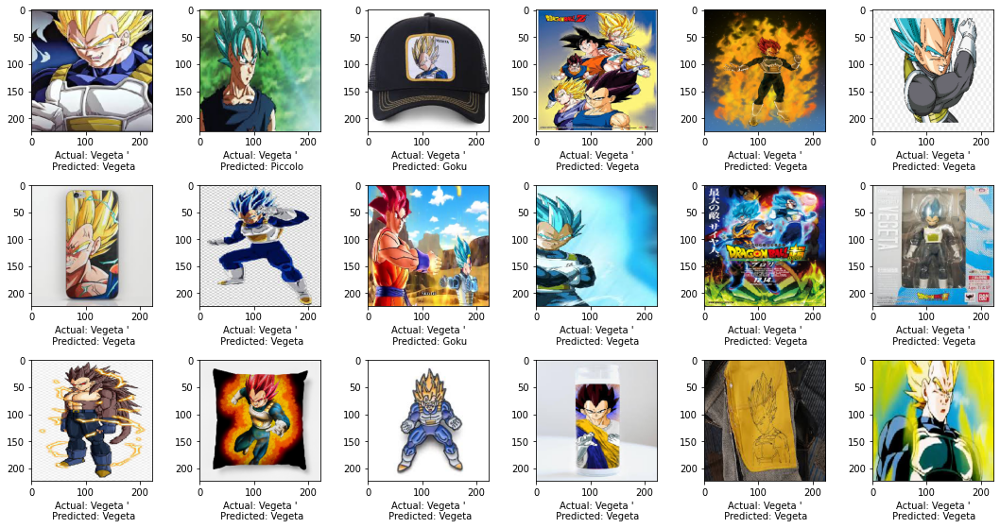

In [66]:
vegeta_df = test_df[test_df['label'] == 'Vegeta']

plot_batch(vegeta_df)
clean()

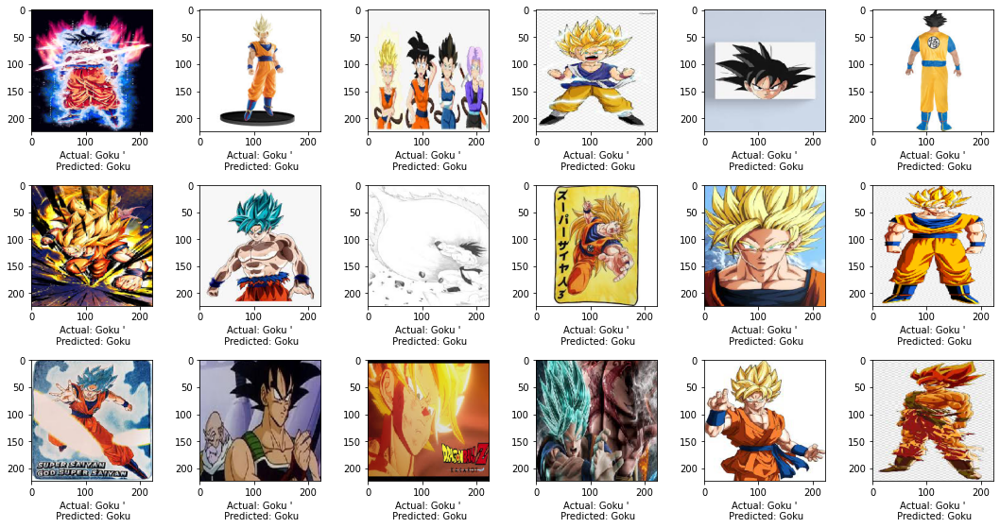

In [67]:
goku_df = test_df[test_df['label'] == 'Goku']

plot_batch(goku_df)
clean()

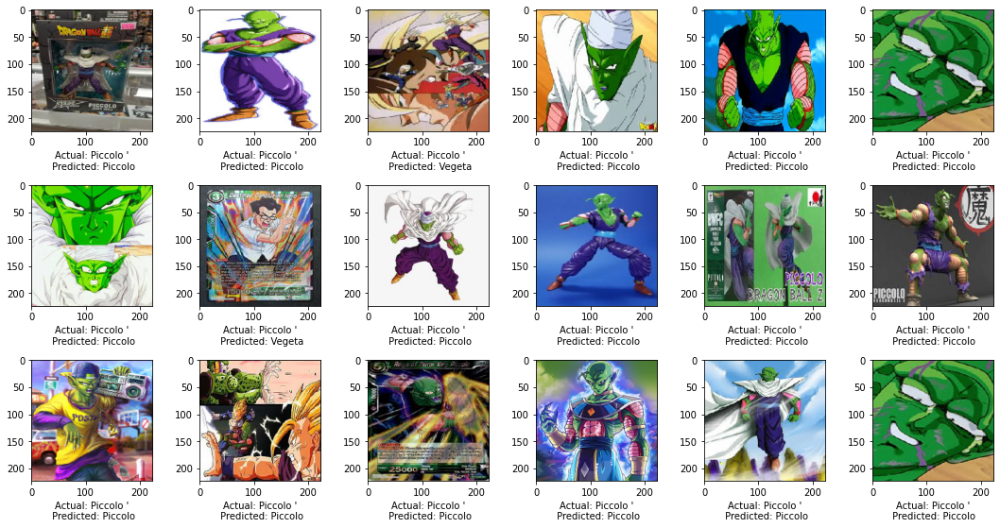

In [68]:
piccolo_df = test_df[test_df['label'] == 'Piccolo']
sample_df = piccolo_df.sample(18)

plot_batch(piccolo_df)
clean()

# VGG16

### VGG16 Generators

In [73]:
vgg_train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

vgg_train_generator = vgg_train_datagen.flow_from_dataframe(
    train_df, 
    x_col='file_path',
    y_col='label',
    target_size=(size,size),
    class_mode='categorical',
    batch_size=batch_size)

Found 3016 validated image filenames belonging to 3 classes.


In [74]:
vgg_validation_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=tf.keras.applications.vgg16.preprocess_input)

vgg_validation_generator = vgg_validation_datagen.flow_from_dataframe(
    valid_df, 
    x_col='file_path',
    y_col='label',
    target_size=(size,size),
    class_mode='categorical',
    batch_size=batch_size)

Found 754 validated image filenames belonging to 3 classes.


In [75]:
batch_shape(vgg_train_generator)

data batch shape: (32, 224, 224, 3)
labels batch shape: (32, 3)


In [76]:
first_batch = next(iter(vgg_train_generator))

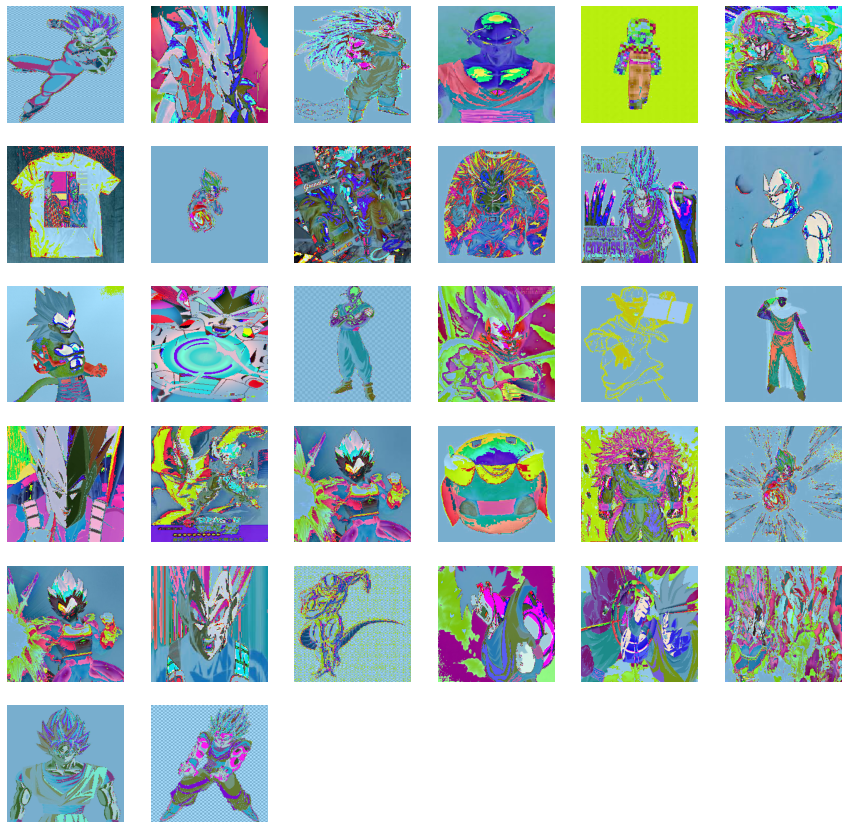

In [77]:
for num, x in enumerate(first_batch[0]):
    img = x
    plt.subplot(6,6,num+1)
    plt.axis('off')
    plt.imshow((img * 255).astype(np.uint8))

plt.gcf().set_size_inches(15, 15)

### VGG16 Model

In [78]:
vgg_base_model = tf.keras.applications.VGG16(weights='imagenet', include_top = False)

58892288/58889256 [==============================] - 1s 0us/step


In [79]:
print(f"The number of layers in the network are: {len(vgg_base_model.layers)}")

The number of layers in the network are: 19


In [80]:
vgg_base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [81]:
x = vgg_base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)

x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)

preds = tf.keras.layers.Dense(3, activation ='softmax')(x)

In [83]:
vgg_model = tf.keras.models.Model(inputs=vgg_base_model.input, outputs=preds)
print(vgg_model.summary())

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)  

In [85]:
for layer in vgg_model.layers[:17]:
  layer.trainable = False

In [86]:
for layer in vgg_model.layers[17:]:
  layer.trainable = True

In [87]:
vgg_model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [89]:
vgg_history = vgg_model.fit(vgg_train_generator, steps_per_epoch=vgg_train_generator.n//vgg_train_generator.batch_size, 
                              epochs = 4, validation_data = vgg_validation_generator)

Epoch 1/4
 9/94 [=>............................] - ETA: 14s - loss: 5.8621 - accuracy: 0.3333

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


94/94 [==============================] - 25s 269ms/step - loss: 1.2773 - accuracy: 0.6210 - val_loss: 0.4892 - val_accuracy: 0.8196
Epoch 2/4
94/94 [==============================] - 24s 250ms/step - loss: 0.3876 - accuracy: 0.8582 - val_loss: 0.3369 - val_accuracy: 0.8700
Epoch 3/4
94/94 [==============================] - 24s 250ms/step - loss: 0.2457 - accuracy: 0.9095 - val_loss: 0.3134 - val_accuracy: 0.8912
Epoch 4/4
94/94 [==============================] - 23s 248ms/step - loss: 0.1696 - accuracy: 0.9467 - val_loss: 0.2422 - val_accuracy: 0.9257


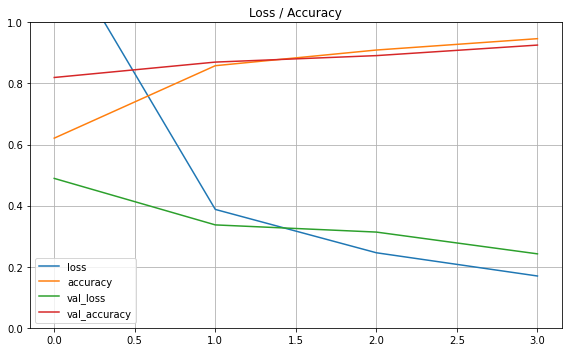

In [90]:
pd.DataFrame(vgg_history.history).plot(figsize=(8, 5))
plt.title('Loss / Accuracy')

plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]

plt.tight_layout()
plt.show()

### Test VGG16

In [92]:
vgg_test_generator = vgg_validation_datagen.flow_from_dataframe(
    test_df,
    x_col='file_path',
    y_col=None,
    class_mode=None,
    target_size=(size,size),
    batch_size=batch_size,
    shuffle=False)

Found 943 validated image filenames.


In [94]:
vgg_predictions = vgg_model.predict(vgg_test_generator)

In [95]:
test_df['vgg_label'] = np.argmax(vgg_predictions, axis =-1)
test_df['vgg_label'] = test_df['vgg_label'].replace(label_map)

In [96]:
test_df['vgg_correct'] = test_df.apply(lambda x: x['label'] == x['vgg_label'], axis =1)

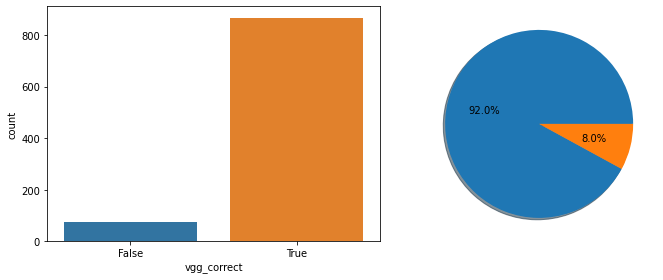

In [98]:
fig, (ax1,ax2) = plt.subplots(ncols = 2, nrows =1, figsize = (10,4))

sns.countplot(x = test_df['vgg_correct'],ax =ax1)
ax2.pie(test_df['vgg_correct'].value_counts(), autopct='%1.1f%%', shadow = True)

clean()

In [99]:
test_df.head()

,file_name,file_path,label,res_label,res_correct,vgg_label,vgg_correct
1324,Goku_321.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Goku/Goku_321.jpg,Goku,Goku,True,Goku,True
3633,Piccolo_692.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Piccolo/Piccolo_692.jpg,Piccolo,Piccolo,True,Piccolo,True
2616,Vegeta_99.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Vegeta/Vegeta_99.jpg,Vegeta,Vegeta,True,Vegeta,True
1841,Vegeta_1139.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Vegeta/Vegeta_1139.jpg,Vegeta,Goku,False,Vegeta,True
1211,Goku_209.jpg,/content/drive/MyDrive/Colab Notebooks/Computer Vision/2. Multi Classification/Saiyan Classifier/Goku/Goku_209.jpg,Goku,Goku,True,Goku,True


In [100]:
sample_df = test_df.sample(18)

In [103]:
def plot_batch(df,path,label, predicted):
  sample_df = df.sample(18)
  for num, x in enumerate(sample_df.values):
    img = load_img(sample_df.iloc[num][path], target_size = (224,224))
    plt.subplot(6,6,num+1)
    plt.xlabel(f"Actual: {sample_df.iloc[num][label]} '\n Predicted: {sample_df.iloc[num][predicted]}")
    plt.imshow(img)
  plt.gcf().set_size_inches(15, 15)
  clean()

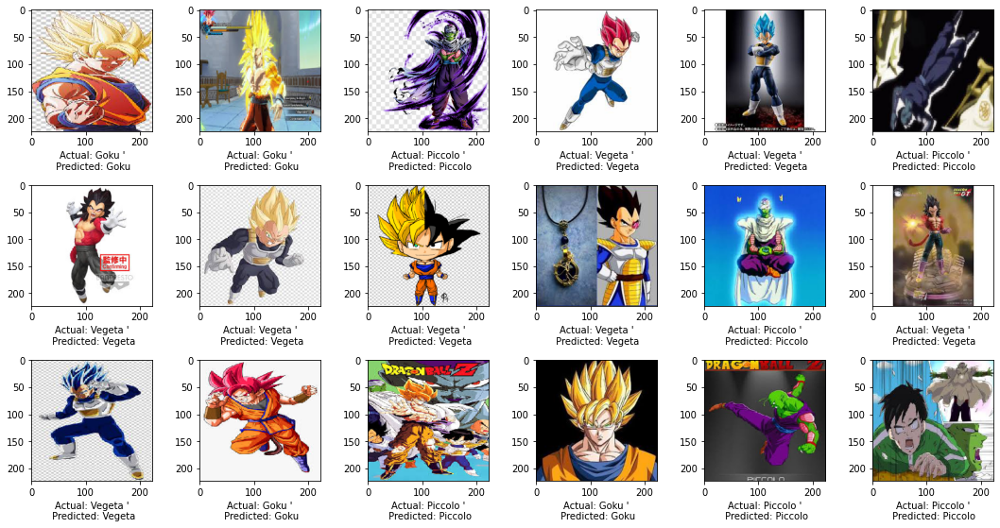

In [104]:
plot_batch(sample_df, 1,2,5)

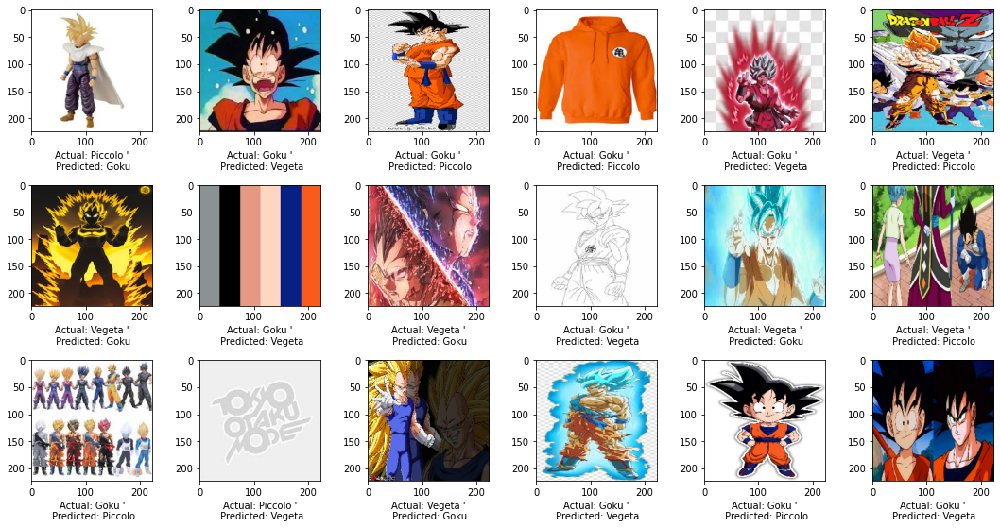

In [105]:
# Plot some of my errors

errors = test_df[test_df['vgg_correct'] == False]
errors_sample = errors.sample(18)

plot_batch(errors_sample,1,2,5)

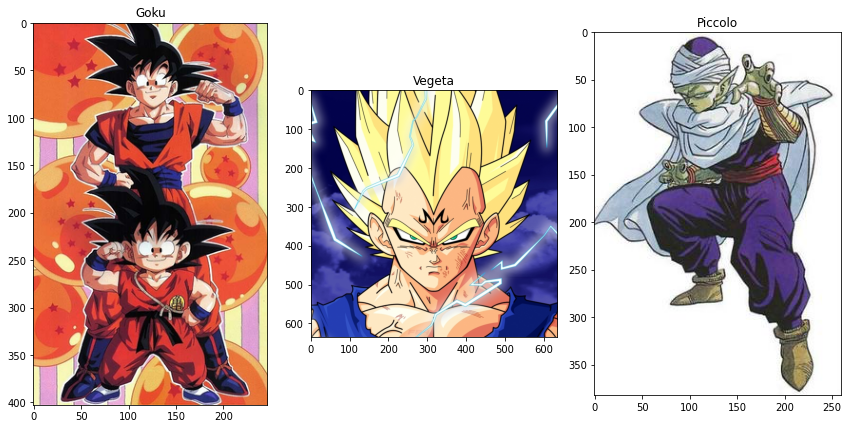

In [106]:
fig, (ax1,ax2, ax3) = plt.subplots(ncols=3, nrows =1,figsize = (12,6))

img1 = mpimg.imread(img_goku_test)
ax1.set_title('Goku')
ax1.imshow(img1)

img2 = mpimg.imread(img_vegeta_test)
ax2.set_title('Vegeta')
ax2.imshow(img2)

img3 = mpimg.imread(img_piccolo_test)
ax3.set_title('Piccolo')
ax3.imshow(img3)

clean()

In [108]:
print(label_map)
print(predict_resnet_img(img_goku_test,vgg_model))
print(predict_resnet_img(img_vegeta_test,vgg_model))
print(predict_resnet_img(img_piccolo_test,vgg_model))

{0: 'Goku', 1: 'Piccolo', 2: 'Vegeta'}
[[0.92223084 0.07623686 0.00153229]]
[[0.27827534 0.17264004 0.5490846 ]]
[[0.03765757 0.9549902  0.00735224]]


In [109]:
vgg16_zfighter = res_model.save(root + '/' + 'vgg16_zfighter.h5')